# Анализ убытков приложения ProcrastinatePRO+

**Описание проекта**

Вы — маркетинговый аналитик развлекательного приложения Procrastinate Pro+. Несмотря на огромные вложения в рекламу, последние несколько месяцев компания терпит убытки. Ваша задача — разобраться в причинах и помочь компании выйти в плюс.

Есть данные о пользователях, привлечённых с 1 мая по 27 октября 2019 года:
- лог сервера с данными об их посещениях,
- выгрузка их покупок за этот период,
- рекламные расходы.

**Навыки и инструменты:**
- python
- pandas
- matplotlib
- seaborn
- юнит-экономика
- когортный анализ
- продуктовые метрики

**Описание данных**

Структура visits_info_short.csv - хранит лог сервера с информацией о посещениях сайта:
- User Id — уникальный идентификатор пользователя,
- Region — страна пользователя,
- Device — тип устройства пользователя,
- Channel — идентификатор источника перехода,
- Session Start — дата и время начала сессии,
- Session End — дата и время окончания сессии.

Структура orders_info_short.csv - информацию о заказах:
- User Id — уникальный идентификатор пользователя,
- Event Dt — дата и время покупки,
- Revenue — сумма заказа.

Структура costs_info_short.csv -  информацию о расходах на рекламу:
- dt — дата проведения рекламной кампании,
- Channel — идентификатор рекламного источника,
- costs — расходы на эту кампанию.


 ### Загрузка данных и подготовка их к анализу

In [1]:
import pandas as pd
from datetime import datetime, timedelta
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#### Загрузка данных

Изучите данные и выполните предобработку. Есть ли в данных пропуски и дубликаты? Убедитесь, что типы данных во всех колонках соответствуют сохранённым в них значениям. Обратите внимание на столбцы с датой и временем.

In [2]:
try:
    visits = pd.read_csv('/datasets/visits_info_short.csv') 
except:
    visits = pd.read_csv('https://code.s3.yandex.net//datasets/visits_info_short.csv') 

In [3]:
try:
    orders = pd.read_csv('/datasets/orders_info_short.csv') 
except:
    orders = pd.read_csv('https://code.s3.yandex.net///datasets/orders_info_short.csv') 

In [4]:
try:
    costs = pd.read_csv('/datasets/costs_info_short.csv') 
except:
    costs = pd.read_csv('https://code.s3.yandex.net///datasets/costs_info_short.csv') 

#### Предобработка и изучение датасета visits.

In [5]:
visits.head(5)

,User Id,Region,Device,Channel,Session Start,Session End
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40


In [6]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   User Id        309901 non-null  int64 
 1   Region         309901 non-null  object
 2   Device         309901 non-null  object
 3   Channel        309901 non-null  object
 4   Session Start  309901 non-null  object
 5   Session End    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


In [7]:
visits.columns = [x.lower() for x in visits.columns] # Приведем названия столбцов к нижнему регистру

In [8]:
visits.columns = visits.columns.str.replace(' ', '_') 

In [9]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   user_id        309901 non-null  int64 
 1   region         309901 non-null  object
 2   device         309901 non-null  object
 3   channel        309901 non-null  object
 4   session_start  309901 non-null  object
 5   session_end    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


In [10]:
visits.isna().sum() # Проверим на пропуски, пропусков нет

user_id          0
region           0
device           0
channel          0
session_start    0
session_end      0
dtype: int64

In [11]:
visits.duplicated().sum() # Дубликатов тоже нет

0

In [12]:
visits['session_start'] = pd.to_datetime(visits['session_start']) # Преобразуем данные о времени для дальнейших расчётов
visits['session_end'] = pd.to_datetime(visits['session_end'])

In [13]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   user_id        309901 non-null  int64         
 1   region         309901 non-null  object        
 2   device         309901 non-null  object        
 3   channel        309901 non-null  object        
 4   session_start  309901 non-null  datetime64[ns]
 5   session_end    309901 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(3)
memory usage: 14.2+ MB


#### Предобработка и изучение датасета orders. 

In [14]:
orders.head(5)

,User Id,Event Dt,Revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99


In [15]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   User Id   40212 non-null  int64  
 1   Event Dt  40212 non-null  object 
 2   Revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


In [16]:
orders.columns = [x.lower() for x in orders.columns] # Приведем названия столбцов к нижнему регистру

In [17]:
orders.columns = orders.columns.str.replace(' ', '_') 

In [18]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   user_id   40212 non-null  int64  
 1   event_dt  40212 non-null  object 
 2   revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


In [19]:
orders.isna().sum()

user_id     0
event_dt    0
revenue     0
dtype: int64

In [20]:
orders.duplicated().sum() # Дубликатов тоже нет

0

In [21]:
orders['event_dt'] = pd.to_datetime(orders['event_dt'])# Преобразуем данные о времени для дальнейших расчётов

In [22]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   user_id   40212 non-null  int64         
 1   event_dt  40212 non-null  datetime64[ns]
 2   revenue   40212 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 942.6 KB


#### Предобработка и изучение датасета costs. 

In [23]:
costs.head(5)

,dt,Channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1


In [24]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   Channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


In [25]:
costs.columns = [x.lower() for x in costs.columns] # Приведем названия столбцов к нижнему регистру

In [26]:
costs.isna().sum() #Пропусков нет

dt         0
channel    0
costs      0
dtype: int64

In [27]:
costs.duplicated().sum() # Дубликатов тоже нет

0

In [28]:
costs['dt'] = pd.to_datetime(costs['dt']).dt.date# Преобразуем данные о времени для дальнейших расчётов

In [29]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


### Задача функций

Задайте функции для расчёта и анализа LTV, ROI, удержания и конверсии.

#### Функция расчёта Retention Rate.

In [30]:
def get_retention(
    profiles,
    sessions,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # добавляем столбец payer в передаваемый dimensions список
    dimensions = ['payer'] + dimensions

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # собираем «сырые» данные для расчёта удержания
    result_raw = result_raw.merge(
        sessions[['user_id', 'session_start']], on='user_id', how='left'
    )
    result_raw['lifetime'] = (
        result_raw['session_start'] - result_raw['first_ts']
    ).dt.days

    # функция для группировки таблицы по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # получаем таблицу удержания
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # получаем таблицу динамики удержания
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # возвращаем обе таблицы и сырые данные
    return result_raw, result_grouped, result_in_time 

#### Функция расчёта Conversion Rate.

In [31]:
def get_conversion(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # определяем дату и время первой покупки для каждого пользователя
    first_purchases = (
        purchases.sort_values(by=['user_id', 'event_dt'])
        .groupby('user_id')
        .agg({'event_dt': 'first'})
        .reset_index()
    )

    # добавляем данные о покупках в профили
    result_raw = result_raw.merge(
        first_purchases[['user_id', 'event_dt']], on='user_id', how='left'
    )

    # рассчитываем лайфтайм для каждой покупки
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days

    # группируем по cohort, если в dimensions ничего нет
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users' 
        dimensions = dimensions + ['cohort']

    # функция для группировки таблицы по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        result = result.fillna(0).cumsum(axis = 1)
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # делим каждую «ячейку» в строке на размер когорты
        # и получаем conversion rate
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # получаем таблицу конверсии
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # для таблицы динамики конверсии убираем 'cohort' из dimensions
    if 'cohort' in dimensions: 
        dimensions = []

    # получаем таблицу динамики конверсии
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # возвращаем обе таблицы и сырые данные
    return result_raw, result_grouped, result_in_time

#### Функция расчёта LTV и ROI.

In [32]:
# функция для расчёта LTV и ROI

def get_ltv(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')
    # добавляем данные о покупках в профили
    result_raw = result_raw.merge(
        purchases[['user_id', 'event_dt', 'revenue']], on='user_id', how='left'
    )
    # рассчитываем лайфтайм пользователя для каждой покупки
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days
    # группируем по cohort, если в dimensions ничего нет
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users'
        dimensions = dimensions + ['cohort']

    # функция группировки по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        # строим «треугольную» таблицу выручки
        result = df.pivot_table(
            index=dims, columns='lifetime', values='revenue', aggfunc='sum'
        )
        # находим сумму выручки с накоплением
        result = result.fillna(0).cumsum(axis=1)
        # вычисляем размеры когорт
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        # объединяем размеры когорт и таблицу выручки
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # считаем LTV: делим каждую «ячейку» в строке на размер когорты
        result = result.div(result['cohort_size'], axis=0)
        # исключаем все лайфтаймы, превышающие горизонт анализа
        result = result[['cohort_size'] + list(range(horizon_days))]
        # восстанавливаем размеры когорт
        result['cohort_size'] = cohort_sizes

        # собираем датафрейм с данными пользователей и значениями CAC, 
        # добавляя параметры из dimensions
        cac = df[['user_id', 'acquisition_cost'] + dims].drop_duplicates()

        # считаем средний CAC по параметрам из dimensions
        cac = (
            cac.groupby(dims)
            .agg({'acquisition_cost': 'mean'})
            .rename(columns={'acquisition_cost': 'cac'})
        )

        # считаем ROI: делим LTV на CAC
        roi = result.div(cac['cac'], axis=0)

        # удаляем строки с бесконечным ROI
        roi = roi[~roi['cohort_size'].isin([np.inf])]

        # восстанавливаем размеры когорт в таблице ROI
        roi['cohort_size'] = cohort_sizes

        # добавляем CAC в таблицу ROI
        roi['cac'] = cac['cac']

        # в финальной таблице оставляем размеры когорт, CAC
        # и ROI в лайфтаймы, не превышающие горизонт анализа
        roi = roi[['cohort_size', 'cac'] + list(range(horizon_days))]

        # возвращаем таблицы LTV и ROI
        return result, roi

    # получаем таблицы LTV и ROI
    result_grouped, roi_grouped = group_by_dimensions(
        result_raw, dimensions, horizon_days
    )

    # для таблиц динамики убираем 'cohort' из dimensions
    if 'cohort' in dimensions:
        dimensions = []

    # получаем таблицы динамики LTV и ROI
    result_in_time, roi_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    return (
        result_raw,  # сырые данные
        result_grouped,  # таблица LTV
        result_in_time,  # таблица динамики LTV
        roi_grouped,  # таблица ROI
        roi_in_time,  # таблица динамики ROI
    )

### Исследовательский анализ данных
- Составьте профили пользователей. Определите минимальную и максимальную даты привлечения пользователей.
- Выясните, из каких стран пользователи приходят в приложение и на какую страну приходится больше всего платящих пользователей. Постройте таблицу, отражающую количество пользователей и долю платящих из каждой страны.
- Узнайте, какими устройствами пользуются клиенты и какие устройства предпочитают платящие пользователи. Постройте таблицу, отражающую количество пользователей и долю платящих для каждого устройства.
- Изучите рекламные источники привлечения и определите каналы, из которых пришло больше всего платящих пользователей. Постройте таблицу, отражающую количество пользователей и долю платящих для каждого канала привлечения.


После каждого пункта сформулируйте выводы.

#### Профили пользователей. 

Составьте профили пользователей. Определите минимальную и максимальную даты привлечения пользователей.

Создадим функцию для создания пользовательских профилей.

In [33]:
def get_profiles(sessions, orders, ad_costs):

    # находим параметры первых посещений
    profiles = (
        sessions.sort_values(by=['user_id', 'session_start'])
        .groupby('user_id')
        .agg(
            {
                'session_start': 'first',
                'channel': 'first',
                'device': 'first',
                'region': 'first',
            }
        )
        .rename(columns={'session_start': 'first_ts'})
        .reset_index()
    )

    # для когортного анализа определяем дату первого посещения
    # и первый день месяца, в который это посещение произошло
    profiles['dt'] = pd.to_datetime(profiles['first_ts']).dt.date
    profiles['month'] = profiles['first_ts'].astype('datetime64[M]')

    # добавляем признак платящих пользователей
    profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())

    # считаем количество уникальных пользователей
    # с одинаковыми источником и датой привлечения
    new_users = (
        profiles.groupby(['dt', 'channel'])
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id': 'unique_users'})
        .reset_index()
    )

    # объединяем траты на рекламу и число привлечённых пользователей
    ad_costs = ad_costs.merge(new_users, on=['dt', 'channel'], how='left')

    # делим рекламные расходы на число привлечённых пользователей
    ad_costs['acquisition_cost'] = ad_costs['costs'] / ad_costs['unique_users']

    # добавляем стоимость привлечения в профили
    profiles = profiles.merge(
        ad_costs[['dt', 'channel', 'acquisition_cost']],
        on=['dt', 'channel'],
        how='left',
    )

    # стоимость привлечения органических пользователей равна нулю
    profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)

    return profiles


In [34]:
profiles = get_profiles(visits,orders,costs)
profiles

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769
...,...,...,...,...,...,...,...,...,...
150003,999956196527,2019-09-28 08:33:02,TipTop,iPhone,United States,2019-09-28,2019-09-01,False,3.500000
150004,999975439887,2019-10-21 00:35:17,organic,PC,UK,2019-10-21,2019-10-01,False,0.000000
150005,999976332130,2019-07-23 02:57:06,TipTop,iPhone,United States,2019-07-23,2019-07-01,False,2.600000
150006,999979924135,2019-09-28 21:28:09,MediaTornado,PC,United States,2019-09-28,2019-09-01,False,0.205714


Мы получили 150 008 пользовательских профилей, в каждом из которых есть данные о дате первого посещения и рекламном источнике,регионе и остальная информация о пользователях.

Найдем минимальную и максимальную даты привлечения пользователей.

In [35]:
min_analysis_date=profiles['dt'].min()
max_analysis_date=profiles['dt'].max()
print(min_analysis_date)
print(max_analysis_date)

2019-05-01
2019-10-27


По условиям ТЗ нам даны данные с 1 мая по 27 октября 2019 года. По полученным расчетам, минимальная и максимальные даты совпадают.

#### Анализ стран.

Выясните, из каких стран пользователи приходят в приложение и на какую страну приходится больше всего платящих пользователей. Постройте таблицу, отражающую количество пользователей и долю платящих из каждой страны.

Напишем функцию для вычисления

In [36]:
def users_info(df, dimension):
    data = (df
    .pivot_table(index=dimension, values='payer', aggfunc=['count', 'sum'])
    .reset_index()
    .droplevel(1, axis=1)
    .rename(columns={'count': 'all_users', 'sum': 'paying_users'}))
    
    
    data['payers'] = round(data['paying_users'] / data['all_users'] * 100, 2) #вычислим процент платящих пользователей 
    data['percent_users'] = round(
        data['all_users'] / data['all_users'].sum() * 100 #вычисляем процент пользователей региона от общего числа пользователей
        , 2)
    data=data.sort_values(by='payers', ascending = False)
    return data


In [37]:
region=users_info(profiles,'region')
region

,region,all_users,paying_users,payers,percent_users
3,United States,100002,6902,6.90,66.66
1,Germany,14981,616,4.11,9.99
2,UK,17575,700,3.98,11.72
0,France,17450,663,3.80,11.63


**Вывод:**
Приложением пользуются пользователи из 4-х стран: США, Германия, Великобритания и Франция.

Больше всего пользователей из США - 100 002 из них 6902 пользователя платят за пользование приложением, также США имеет больший всего процент платящих пользователей - 6,9%. Когорта пользователей из США также самая большая, составляет 66,66% от общего числа пользователей.
Минимальное число платящих пользователей находятся во Франции, всего 663 пользователя, это 3,8% от всех пользователей из Франции.

#### Анализ устройств.

Узнайте, какими устройствами пользуются клиенты и какие устройства предпочитают платящие пользователи. Постройте таблицу, отражающую количество пользователей и долю платящих для каждого устройства.

In [38]:
device=users_info(profiles,'device')
device

,device,all_users,paying_users,payers,percent_users
1,Mac,30042,1912,6.36,20.03
3,iPhone,54479,3382,6.21,36.32
0,Android,35032,2050,5.85,23.35
2,PC,30455,1537,5.05,20.30


**Вывод:**
Больше всего платящих пользователей пользуются Mac- 6,36% от всех пользователей Mac, но они занимают меньше всего пользователей от общего числа пользователей. Меньше всего за пользованием приложением платят пользователи PC. 
Больше всего приложением пользуются пользователи на устройствах Iphone.

#### Анализ источников рекламы.

In [39]:
channel = users_info(profiles,'channel')
channel

,channel,all_users,paying_users,payers,percent_users
1,FaceBoom,29144,3557,12.20,19.43
0,AdNonSense,3880,440,11.34,2.59
9,lambdaMediaAds,2149,225,10.47,1.43
6,TipTop,19561,1878,9.60,13.04
5,RocketSuperAds,4448,352,7.91,2.97
7,WahooNetBanner,8553,453,5.30,5.70
8,YRabbit,4312,165,3.83,2.87
3,MediaTornado,4364,156,3.57,2.91
2,LeapBob,8553,262,3.06,5.70
4,OppleCreativeMedia,8605,233,2.71,5.74


Всего выявили 10 рекламных источников. Наибольшее кол-во платящих пользователей пришло из FaceBoom - 12,2% от привлеченных с этого источника пользователей. На втором месте AdNonSense - 11,34%, на третьем месте lambdaMediaAds - 10,47%. 

Больше всего органических пользователей - 56 439 пользователей (37,62% от общего числа пользователей), но процент платящих пользователей с этого источника небольшой, всего 2, 06%. На втором месте по общему привлечению - FaceBoom (19,43%), на третьем месте - TipTop (13,04%)

### Маркетинг

- Посчитайте общую сумму расходов на маркетинг.
- Выясните, как траты распределены по рекламным источникам, то есть сколько денег потратили на каждый источник.
- Постройте визуализацию динамики изменения расходов во времени (по неделям и месяцам) по каждому источнику. Постарайтесь отразить это на одном графике.
- Узнайте, сколько в среднем стоило привлечение одного пользователя (CAC) из каждого источника. Используйте профили пользователей.

Напишите промежуточные выводы.

#### Общая сумма расходов

Посчитаем общую сумму расходов на маркетинг.

In [40]:
market_costs=round(costs['costs'].sum(),2)
market_costs

105497.3

Всего на маркетинг было потрачено 105 497.3 у.е

#### Распределение трат по рекламным источникам

Посмотрим, как распределены траты по источникам.

In [41]:
costs.groupby('channel').agg({'costs': 'sum'}).sort_values(by='costs', ascending=False)

,costs
channel,
TipTop,54751.30
FaceBoom,32445.60
WahooNetBanner,5151.00
AdNonSense,3911.25
OppleCreativeMedia,2151.25
RocketSuperAds,1833.00
LeapBob,1797.60
lambdaMediaAds,1557.60
MediaTornado,954.48


Больше всего было затрачено на привелечение из источника TipTop (54751,30 ед.) и FaceBoom (32445,60 ед.). Что примечательно, из источника FaceBoom пришло больше всего платящих пользователей. Последние места занимают канал YRabbit (944,22 ед.) и MediaTornado (954,48 ед.). 

#### Визуализация динамики изменения расходов во времени.

Постройте визуализацию динамики изменения расходов во времени (по неделям и месяцам) по каждому источнику. Постарайтесь отразить это на одном графике.

In [42]:
#Добавим новые столбцы для анализа и изменим тип данных
costs['dt']=pd.to_datetime(costs['dt'])
costs['month'] = costs['dt'].dt.month
costs['week']=costs['dt'].dt.isocalendar().week
costs

,dt,channel,costs,month,week
0,2019-05-01,FaceBoom,113.3,5,18
1,2019-05-02,FaceBoom,78.1,5,18
2,2019-05-03,FaceBoom,85.8,5,18
3,2019-05-04,FaceBoom,136.4,5,18
4,2019-05-05,FaceBoom,122.1,5,18
...,...,...,...,...,...
1795,2019-10-23,lambdaMediaAds,4.0,10,43
1796,2019-10-24,lambdaMediaAds,6.4,10,43
1797,2019-10-25,lambdaMediaAds,8.8,10,43
1798,2019-10-26,lambdaMediaAds,8.8,10,43


Посмотрим, сколько было потрачено по месяцам

In [43]:
costs_month=costs.pivot_table(index='month',values='costs',  
    aggfunc='sum').sort_values(by='costs',ascending=False)
costs_month

,costs
month,
9,22441.340
10,20882.415
8,20657.870
7,16447.060
6,15090.045
5,9978.570


Больше всего на привлечение было потраченно в сентябре, меньше всего в мае.

In [44]:
costs_week=costs.pivot_table(index='week',values='costs',  
    aggfunc='sum').sort_values(by='costs',ascending=False)
costs_week

,costs
week,
39,6784.580
40,6365.370
43,5601.140
38,5473.535
41,5190.355
26,4837.120
35,4732.160
33,4703.960
42,4679.935


Больше всего привлечений было сделано в 39 и 40 недели (что соответсвует концу изучаемого периода). Меньше всего привлечений было в 18 и 20 недели.

Посмотрим по графикам на распределение привлечений по месяцам и неделям.

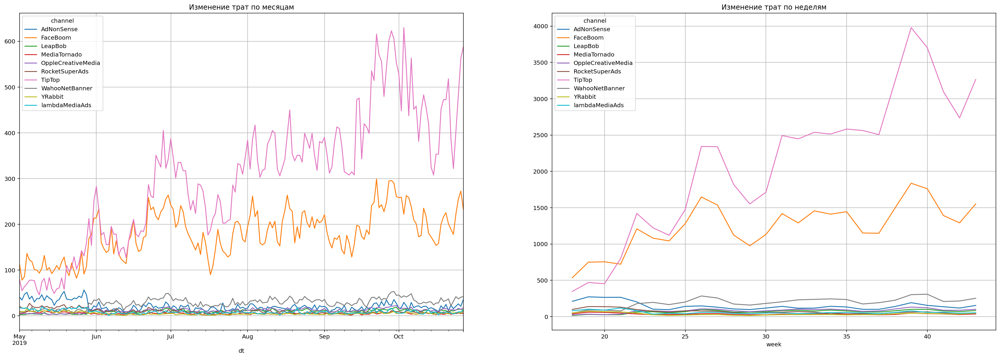

In [45]:
fig, axes = plt.subplots(1,2, figsize=(30, 15))


costs2 = costs.pivot_table(
    index='dt',   
    columns='channel', 
    values='costs',  
    aggfunc='sum',  
).plot(figsize=(30, 10), grid=True, ax=axes[0])
axes[0].set(title='Изменение трат по месяцам')

costs.pivot_table(
    index='week', 
    columns='channel', 
    values='costs',  
    aggfunc='sum',  
).plot(figsize=(30, 10), grid=True, ax=axes[1])
axes[1].set(title='Изменение трат по неделям')


plt.show()

По данным графикам мы можем видеть, что наибольшие расходы имеют источники TipTop и FaceBoom с мая по сентябрь растут и сильно выбиваются из всех источников. Это же можем видеть и на графике с разбивкой по неделям. Уберем эти два источника, чтобы посмотреть на остальные источники.

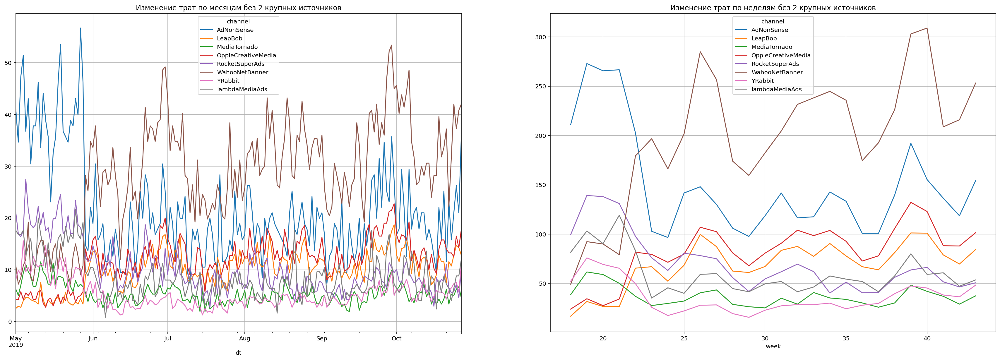

In [46]:
fig, axes = plt.subplots(1,2, figsize=(30, 15))

costs_2 = costs[(costs.channel != 'FaceBoom') & (costs.channel != 'TipTop')]
costs_2.pivot_table(
    index='dt',   
    columns='channel', 
    values='costs',  
    aggfunc='sum',  
).plot(figsize=(30, 10), grid=True, ax=axes[0])
axes[0].set(title='Изменение трат по месяцам без 2 крупных источников')


costs_2.pivot_table(
    index='week', 
    columns='channel', 
    values='costs',  
    aggfunc='sum',  
).plot(figsize=(30, 10), grid=True, ax=axes[1])
axes[1].set(title='Изменение трат по неделям без 2 крупных источников')


plt.show()

По данным мы можем увидеть, что затраты на оставшиеся источники со временем, во-первых, значительно ниже по сравнению с TipTop и FaceBoom,меньше 50 у.е, во-вторых, с течением времени имеют меньший рост и динамику.

#### Расчет (CAC) из каждого источника.

Узнайте, сколько в среднем стоило привлечение одного пользователя (CAC) из каждого источника. Используйте профили пользователей.


In [47]:
profiles.head(5)

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769


Столбец `acquisition_cost` содержит стоимостью привлечения каждого посетителя.


Посмотрим на среднюю стоимость привлечения каждого посетителя для каждого источника.

In [48]:
profiles.pivot_table(
    index='channel',values='acquisition_cost', aggfunc='mean').sort_values(by='acquisition_cost',ascending=False)

,acquisition_cost
channel,
TipTop,2.799003
FaceBoom,1.113286
AdNonSense,1.008054
lambdaMediaAds,0.724802
WahooNetBanner,0.602245
RocketSuperAds,0.412095
OppleCreativeMedia,0.250000
YRabbit,0.218975
MediaTornado,0.218717


Дороже всего стоит привлечение из TipTop, около 2,8 ед., далее FaceBoom (1,1 ед.) и AdNonSense(1 ед.). Органический трафик, соответственно, бесплатный. 

In [49]:
profiles = profiles.query('channel != "organic"')

In [50]:
profiles['acquisition_cost'].mean()

1.1274813239427588

Средний CAC по всему проекту составил 1.13 ед.

Выясним, как меняется стоимость привлечения для каждого источника. Построим сводную таблицу, в которой названиями строк будут даты привлечения пользователей, названиями столбцов — каналы привлечения, а значениями — средний CAC, и построим по ней график истории изменений.

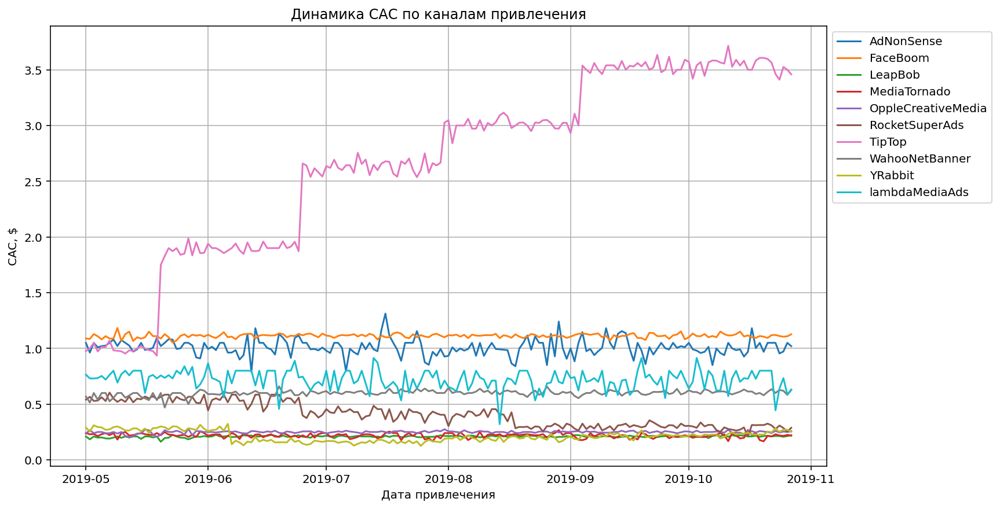

In [51]:
profiles.pivot_table(
    index='dt', columns='channel', values='acquisition_cost', aggfunc='mean'
).plot(grid=True, figsize=(12, 7))
plt.ylabel('CAC, $')
plt.xlabel('Дата привлечения')
plt.title('Динамика САС по каналам привлечения')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='best')
plt.show()

По графику мы видим, стоимость привлечения источника TipTop лидирует и со временем растет. Органический трафик равен 0, так как был привлечен не за счет рекламы. Остальные источники, по сравнению с TipTop, имеет менее выраженный рост.

### Расчет окупаемости рекламы

Используя графики LTV, ROI и CAC, проанализируйте окупаемость рекламы. Считайте, что на календаре 1 ноября 2019 года, а в бизнес-плане заложено, что пользователи должны окупаться не позднее чем через две недели после привлечения. Необходимость включения в анализ органических пользователей определите самостоятельно.

- Проанализируйте окупаемость рекламы c помощью графиков LTV и ROI, а также графики динамики LTV, CAC и ROI.
- Проверьте конверсию пользователей и динамику её изменения. То же самое сделайте с удержанием пользователей. Постройте и изучите графики конверсии и удержания.
- Проанализируйте окупаемость рекламы с разбивкой по устройствам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.
- Проанализируйте окупаемость рекламы с разбивкой по странам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.
- Проанализируйте окупаемость рекламы с разбивкой по рекламным каналам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.

Ответьте на такие вопросы:
- Окупается ли реклама, направленная на привлечение пользователей в целом?
- Какие устройства, страны и рекламные каналы могут оказывать негативное влияние на окупаемость рекламы?
- Чем могут быть вызваны проблемы окупаемости?

Напишите вывод, опишите возможные причины обнаруженных проблем и промежуточные рекомендации для рекламного отдела.


#### Анализ окупаемости рекламы

Проанализируйте окупаемость рекламы c помощью графиков LTV и ROI, а также графики динамики LTV, CAC и ROI

Установим момент на 1 ноября 2019 года и зададим 2х-недельный горизонт анализа.

In [52]:
observation_date = datetime(2019, 11, 1).date()  # момент анализа
horizon_days = 14


In [53]:
# функция для сглаживания фрейма
def filter_data(df, window):
    # для каждого столбца применяем скользящее среднее
    for column in df.columns.values:
        df[column] = df[column].rolling(window).mean() 
    return df 

In [54]:
#функция для визуализации LTV и ROI
def plot_ltv_roi(ltv, ltv_history, roi, roi_history, horizon, window=7):

    # задаём сетку отрисовки графиков
    plt.figure(figsize=(30, 15))

    # из таблицы ltv исключаем размеры когорт
    ltv = ltv.drop(columns=['cohort_size'])
    # в таблице динамики ltv оставляем только нужный лайфтайм
    ltv_history = ltv_history.drop(columns=['cohort_size'])[[horizon - 1]]

    # стоимость привлечения запишем в отдельный фрейм
    cac_history = roi_history[['cac']]

    # из таблицы roi исключаем размеры когорт и cac
    roi = roi.drop(columns=['cohort_size', 'cac'])
    # в таблице динамики roi оставляем только нужный лайфтайм
    roi_history = roi_history.drop(columns=['cohort_size', 'cac'])[
        [horizon - 1]
    ]

    # первый график — кривые ltv
    ax1 = plt.subplot(2, 3, 1)
    ltv.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('LTV', fontsize=25)

    # второй график — динамика ltv
    ax2 = plt.subplot(2, 3, 2, sharey=ax1)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name for name in ltv_history.index.names if name not in ['dt']]
    filtered_data = ltv_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика LTV пользователей на {}-й день'.format(horizon), fontsize=25)

    # третий график — динамика cac
    ax3 = plt.subplot(2, 3, 3, sharey=ax1)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name for name in cac_history.index.names if name not in ['dt']]
    filtered_data = cac_history.pivot_table(
        index='dt', columns=columns, values='cac', aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика стоимости привлечения пользователей', fontsize=25)


    # четвёртый график — кривые roi
    ax4 = plt.subplot(2, 3, 4)
    roi.T.plot(grid=True, ax=ax4)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('ROI', fontsize=25)

    # пятый график — динамика roi
    ax5 = plt.subplot(2, 3, 5, sharey=ax4)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name for name in roi_history.index.names if name not in ['dt']]
    filtered_data = roi_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax5)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.xlabel('Дата привлечения')
    plt.title('Динамика ROI пользователей на {}-й день'.format(horizon), fontsize=25)
    
    plt.tight_layout()
    plt.show()

Рассчитаем и визуализируем LTV и ROI.

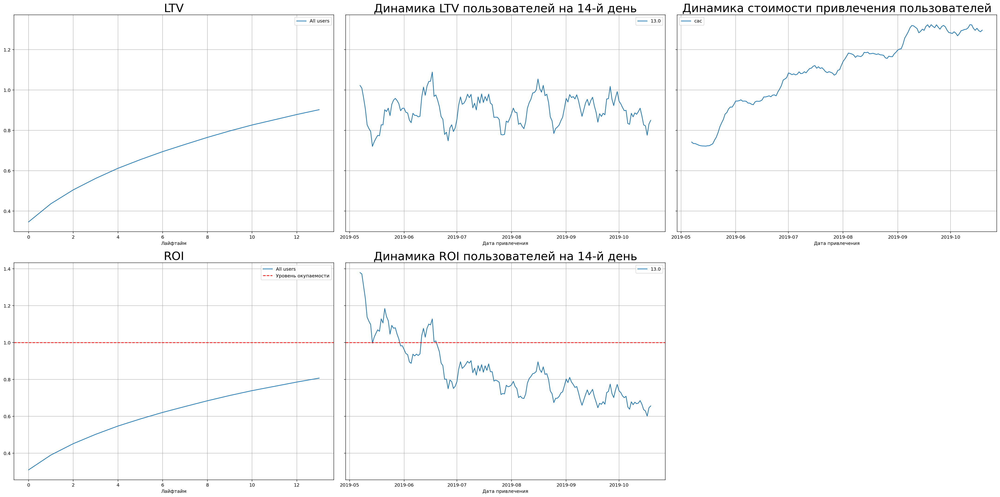

In [55]:
# считаем LTV и ROI
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days)

# строим графики
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days) 

По графикам мы можем сделать следующие выводы:
- LTV показатель достаточно стабилен
- Реклама совсем не окупается, ROI не дотягивает до линии окупаемости и на 14 день около 60%.
- САС со временем растет, что говорит о том, что рекламная кампания скорее всего не работает, т.к расходы на рекламу растут, а она не окупается.

#### Окупаемость рекламы с разбивкой по устройствам. 

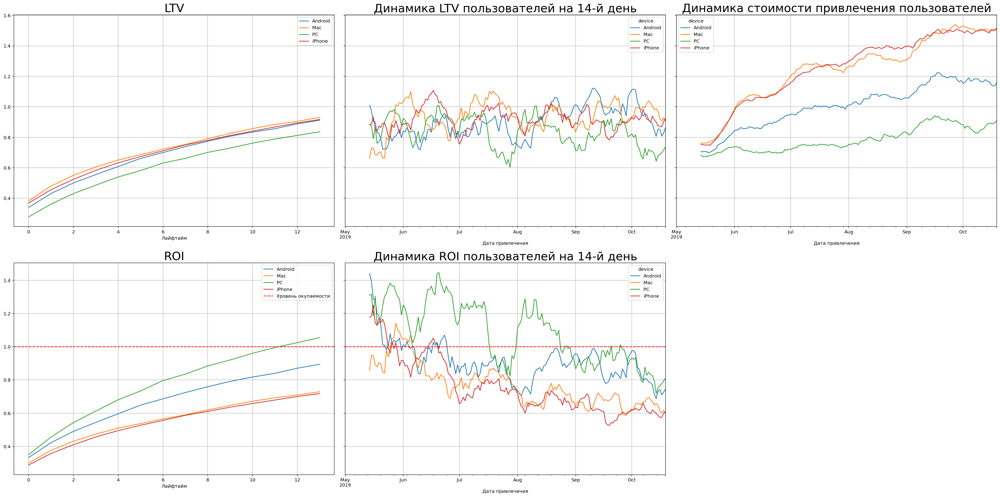

In [56]:
dimensions = ['device']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 


По графикам мы можем видеть, что пользователя PC окупаются, а вот владельцы IPhone и Mac совсем не окупаются, хотя стоимость на их привлечение выше, чем на других платформах. Также заметно снижение динамики ROI у всех устройств.

#### Окупаемость рекламы с разбивкой по странам.

Проанализируйте окупаемость рекламы с разбивкой по странам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.

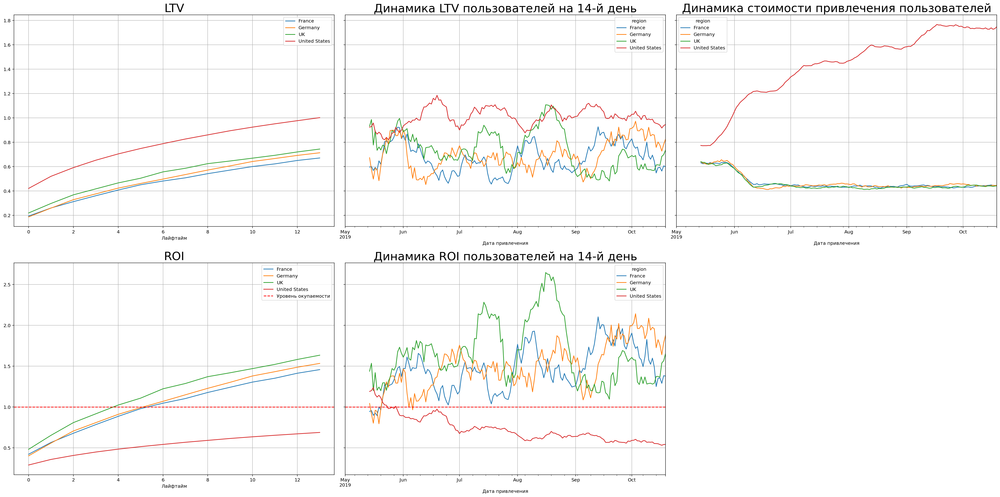

In [57]:
dimensions = ['region']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 


В разбивке по странам сильно выбивается США. США единственная страна, где не окупилась реклама, при этом расходы на рекламу в этой стране разительно выше, чем в других странах, также ROI в США падает ниже, хотя LTV выше, чем во всех остальных странах.

#### Окупаемость с разбивкой по рекламным каналам.

Проанализируйте окупаемость рекламы с разбивкой по рекламным каналам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.

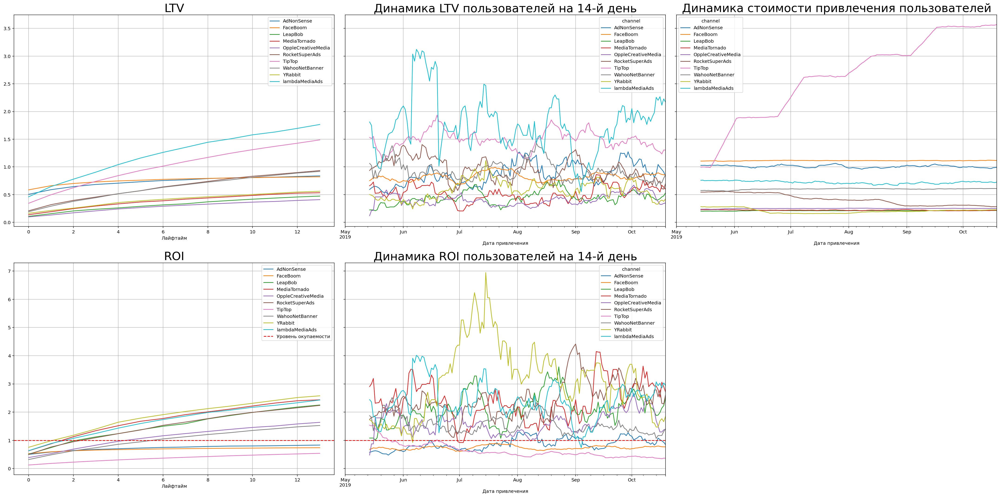

In [58]:
dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 

Выше всего LTV в TipTop и lambdaMediaAds,также TipTop имеет сильно выше стоимость привлечения, однако TipTop не достигает порога окупаемости.Также не окупаются еще 2 канала. У остальных каналов динамика привлечения стабильная.

Посмотрим поближе на конверсию и удержание пользователей.

####  Конверсия пользователей и динамика её изменения.

Проверьте конверсию пользователей и динамику её изменения. То же самое сделайте с удержанием пользователей. Постройте и изучите графики конверсии и удержания.

In [59]:
# функция для визуализации удержания

def plot_retention(retention, retention_history, horizon, window=7):

    # задаём размер сетки для графиков
    plt.figure(figsize=(15, 10))

    # исключаем размеры когорт и удержание первого дня
    retention = retention.drop(columns=['cohort_size', 0])
    # в таблице динамики оставляем только нужный лайфтайм
    retention_history = retention_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # если в индексах таблицы удержания только payer,
    # добавляем второй признак — cohort
    if retention.index.nlevels == 1:
        retention['cohort'] = 'All users'
        retention = retention.reset_index().set_index(['cohort', 'payer'])

    # в таблице графиков — два столбца и две строки, четыре ячейки
    # в первой строим кривые удержания платящих пользователей
    ax1 = plt.subplot(2, 2, 1)
    retention.query('payer == True').droplevel('payer').T.plot(
        grid=True, ax=ax1
    )
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Удержание платящих пользователей')

    # во второй ячейке строим кривые удержания неплатящих
    # вертикальная ось — от графика из первой ячейки
    ax2 = plt.subplot(2, 2, 2, sharey=ax1)
    retention.query('payer == False').droplevel('payer').T.plot(
        grid=True, ax=ax2
    )
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Удержание неплатящих пользователей')

    # в третьей ячейке — динамика удержания платящих
    ax3 = plt.subplot(2, 2, 3)
    # получаем названия столбцов для сводной таблицы
    columns = [
        name
        for name in retention_history.index.names
        if name not in ['dt', 'payer']
    ]
    # фильтруем данные и строим график
    filtered_data = retention_history.query('payer == True').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Дата привлечения')
    plt.title(
        'Динамика удержания платящих пользователей на {}-й день'.format(
            horizon
        )
    )

    # в чётвертой ячейке — динамика удержания неплатящих
    ax4 = plt.subplot(2, 2, 4, sharey=ax3)
    # фильтруем данные и строим график
    filtered_data = retention_history.query('payer == False').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax4)
    plt.xlabel('Дата привлечения')
    plt.title(
        'Динамика удержания неплатящих пользователей на {}-й день'.format(
            horizon
        )
    )
    
    plt.tight_layout()
    plt.show()

In [60]:
# функция для визуализации конверсии

def plot_conversion(conversion, conversion_history, horizon, window=7):

    # задаём размер сетки для графиков
    plt.figure(figsize=(15, 5))

    # исключаем размеры когорт
    conversion = conversion.drop(columns=['cohort_size'])
    # в таблице динамики оставляем только нужный лайфтайм
    conversion_history = conversion_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # первый график — кривые конверсии
    ax1 = plt.subplot(1, 2, 1)
    conversion.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Конверсия пользователей')

    # второй график — динамика конверсии
    ax2 = plt.subplot(1, 2, 2, sharey=ax1)
    columns = [
        # столбцами сводной таблицы станут все столбцы индекса, кроме даты
        name for name in conversion_history.index.names if name not in ['dt']
    ]
    filtered_data = conversion_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика конверсии пользователей на {}-й день'.format(horizon))

    plt.tight_layout()
    plt.show()

Посмотрим на конверсию с разбивкой по устройствам.

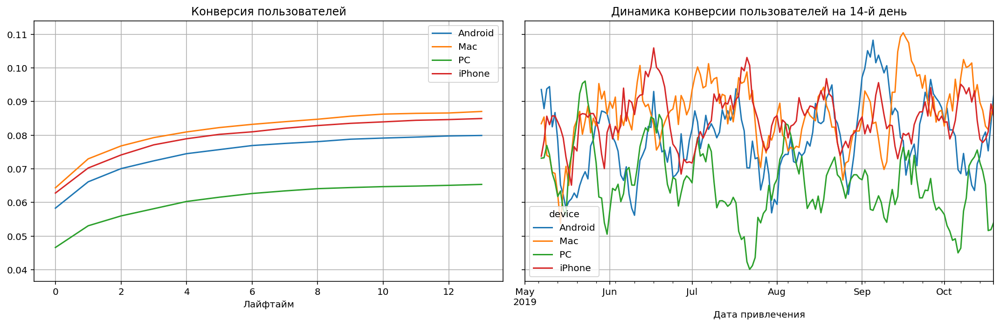

In [61]:
dimensions=['device']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

Судя по графикам, хуже всего конвертируются пользователи PC, хоть они и окупаются.Лучше всего конвертируются пользователи  Mac и Iphone, хотя реклама на их привлечение совсем не окупается. 

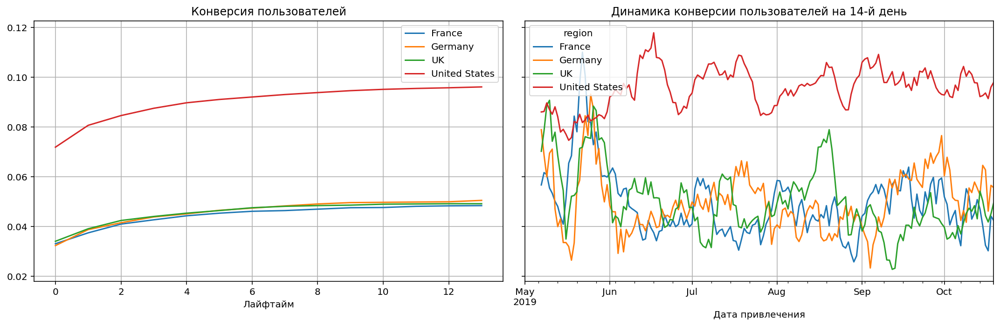

In [62]:
dimensions=['region']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

Судя по графикам, больше всего конвертируются пользователи из США, остальные страны показывают конверсию в разы меньше. На 14 день мы видим, что в июне в дургих странах еще была высокая конверсия, потом США выбились вверх.

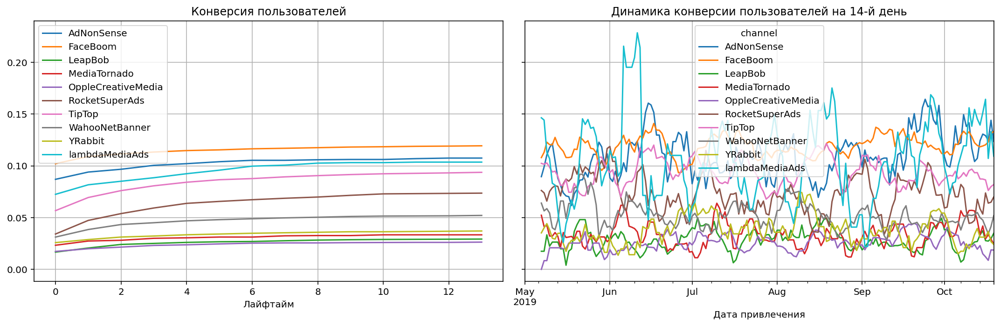

In [63]:
dimensions=['channel']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

В разрезе конверсии по привлечению каналов, мы видим, что наиболее конвертируемые пользователи приходят из канала FaceBoom, остальные каналы конвертируются чуть хуже. Хуже всего конвертируются пользователи из канала OppleCreativeMedia, LeapBob,MediaTornado.

Посмотрим на удержание пользователей.

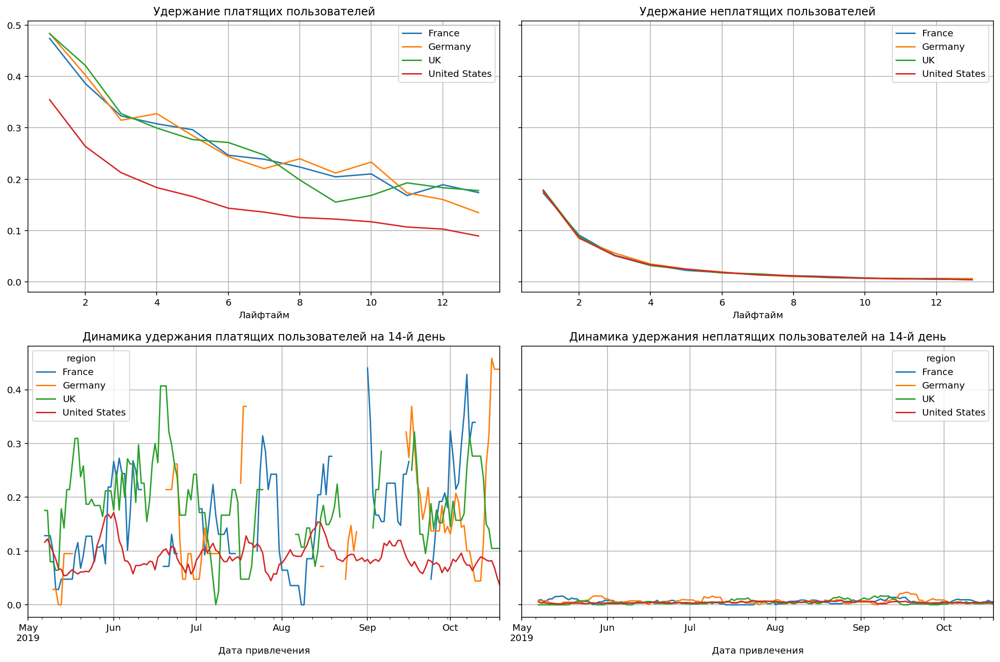

In [64]:
dimensions=['region']

retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days) 

Удержание и платящих и не платящих пользоваталей стабильно падает к концу изучаемого периода.

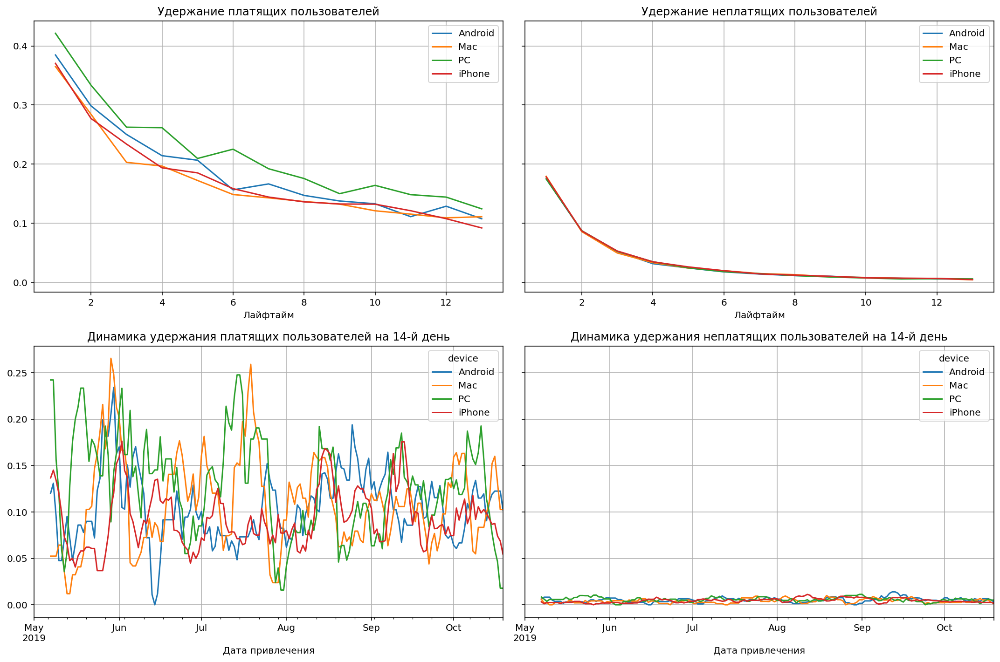

In [65]:
dimensions=['device']

retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days) 

По графикам мы видим, что лучше всего происходит удержание пользователей PC, хуже всего пользователи Apple. В целом, удержание пользоватлей со временем падает.

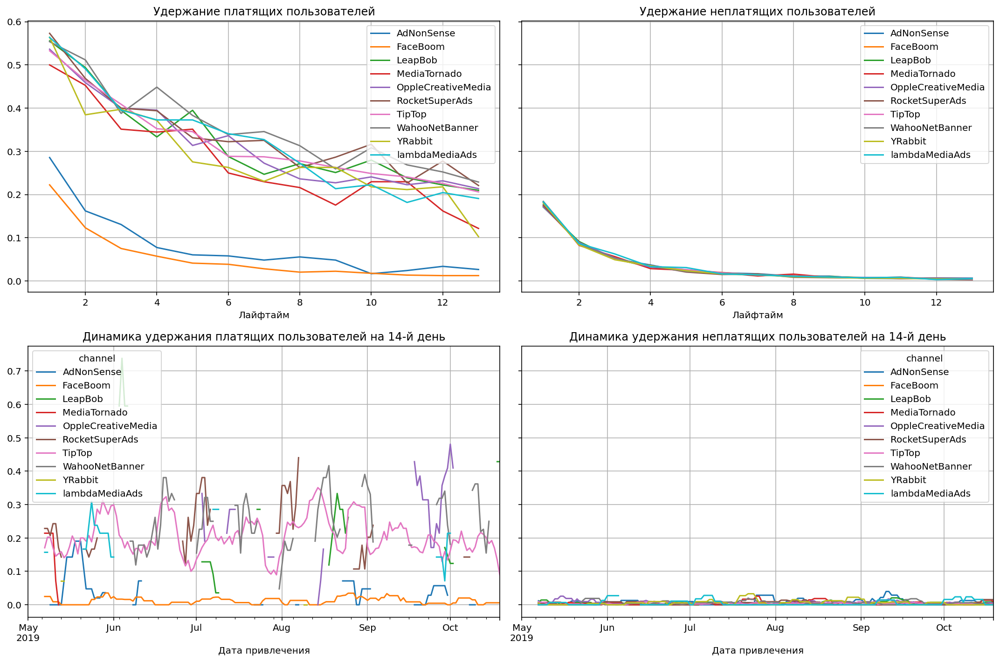

In [66]:
dimensions=['channel']

retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days) 

Неожиданно, но хуже всего удерживаются пользователи из канала FaceBoom и AdNonSense. Несмотря на то, что пользователи из канала FaceBoom конвертируются лучше остальных, они хуже всего удерживаются.

**Вывод:**
- Судя по графикам, CAC > ROI, что говорит о том, что реклама, направленная на привлечение, не окупается.
- Хуже всего окупаются устройства IPhone и Mac, хотя стоимость на их привлечение выше, чем на других платформах. 
  Также самые плохие показатели имеются в США. США. Несмотря на то, что расходы на рекламу выше, чем в других странах реклама не окупается.
- Проблема окупаемости может быть в плохом распределении денежных средств на привлечение и неправильное определение устройств, источников привлечение и стран для маркетинговой кампании.

Посмотрим отдельно показатели США и Европы.

In [72]:
USA=profiles[(profiles.region == 'United States')]

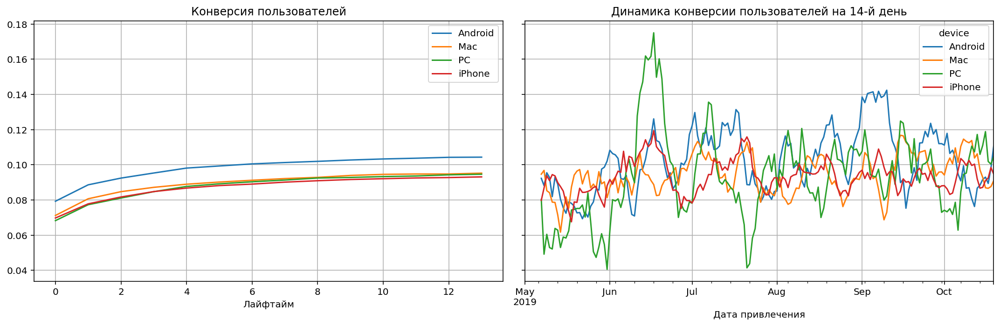

In [75]:
dimensions=['device']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    USA, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

По графикам мы видим, что в США лучше всего конвертируются пользователи Android.На 14 день лучше всего конвертируются пользователи PC и Android.

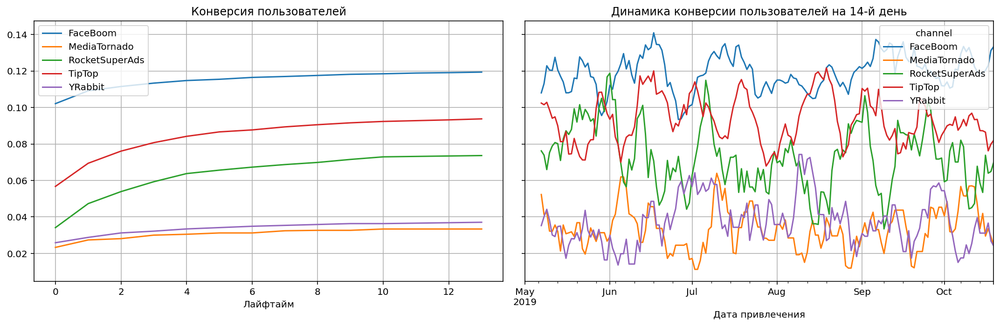

In [76]:
dimensions=['channel']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    USA, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

В США лучше всего конвертируются пользователи, пришедшие из источника FaceBoom, TipTop и RocketSuperAds, остальные источники конвертируются хуже.

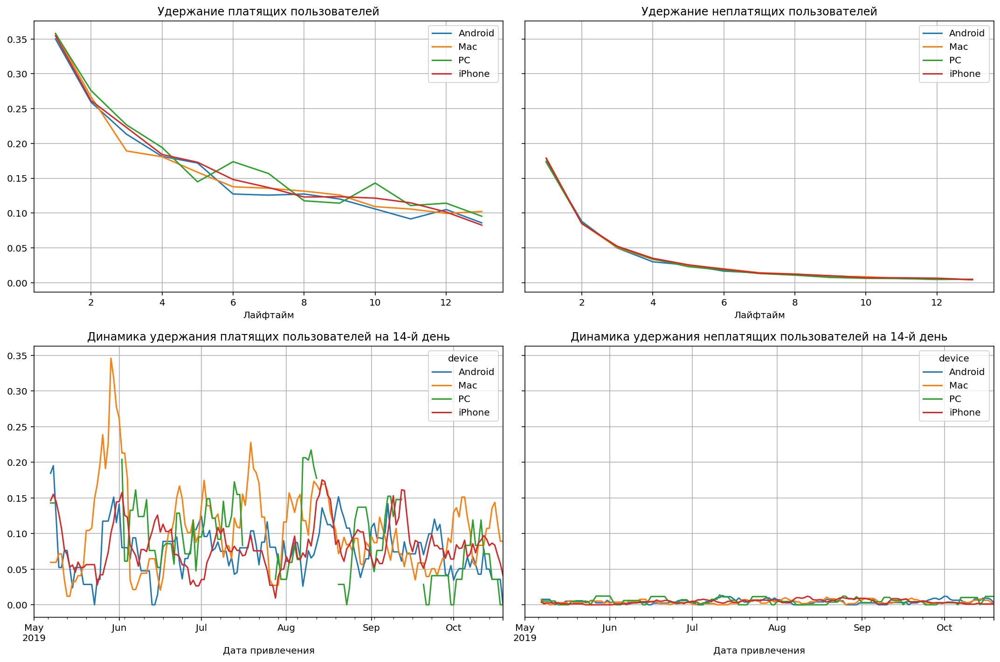

In [77]:
dimensions=['device']

retention_raw, retention_grouped, retention_history = get_retention(
    USA, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days) 

Удержание в целом снижается. Среди платящих пользователей лучше всего удерживаются пользователи Mac и PC. Неплатящие пользователи удерживаются совсем плохо.

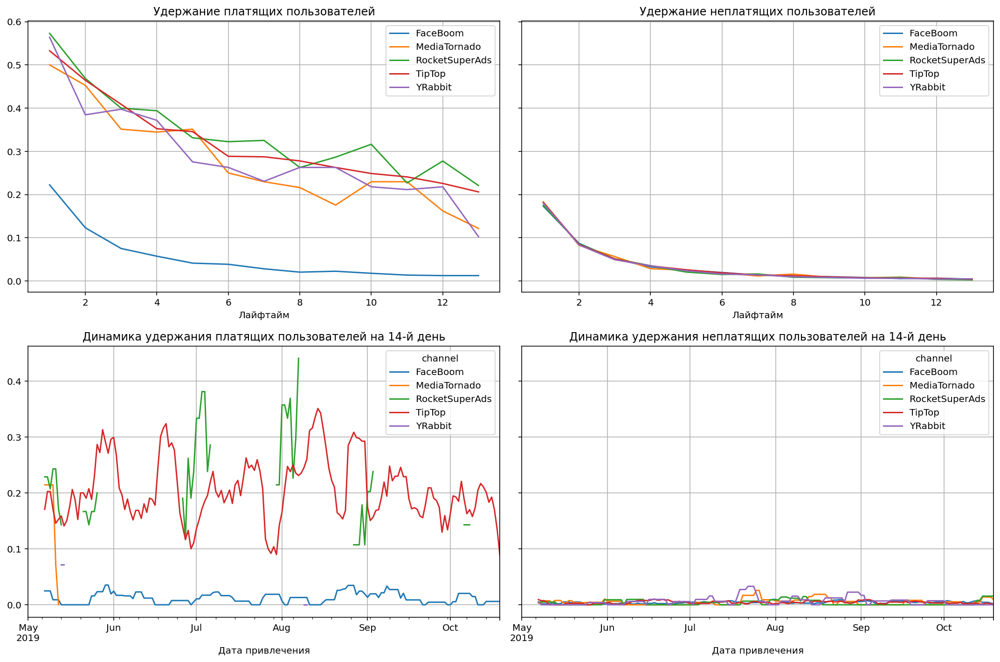

In [78]:
dimensions=['channel']

retention_raw, retention_grouped, retention_history = get_retention(
    USA, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days) 

Хуже всего удерживаются пользователи, пришедшие из FaceBoom,что удивительно, ведь пользователи из этого источника больше всего конвертируются.

**Вывод по США:**
Несмотря на то, что наиболее конвертируемым источником является FaceBoom, пользователи из этого канала совсем не удерживаются в приложении. Можно предположить, что пользователи в этом источнике привлекались какой-нибудь одноразовой акцией или каким-нибудь целевым действием, пользователи переходили в приложение, платили один раз и уходили. 

In [83]:
Europe=profiles[(profiles.region != 'United States')]

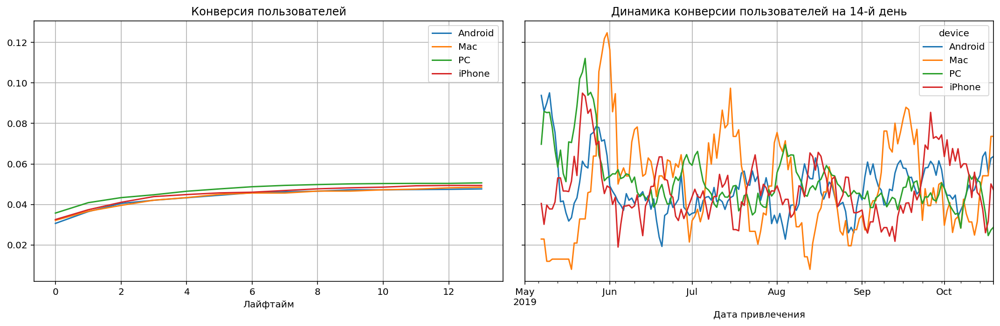

In [84]:
dimensions=['device']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    Europe, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

По сравнению с США, в Европе нет явных лидеров среди устройств. На 14 день активнее всего конвертируются пользователи Mac.

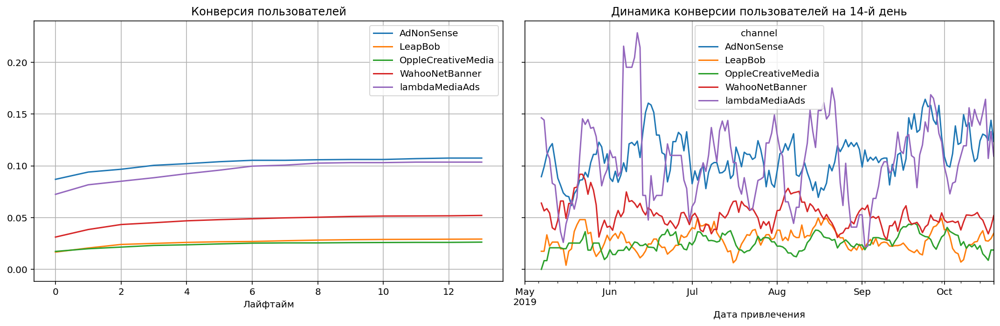

In [85]:
dimensions=['channel']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    Europe, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

Наиболее прибыльными каналами привлечения являются AdNonSense и lambdaMediaAds.Остальные каналы конвертируются немного хуже.

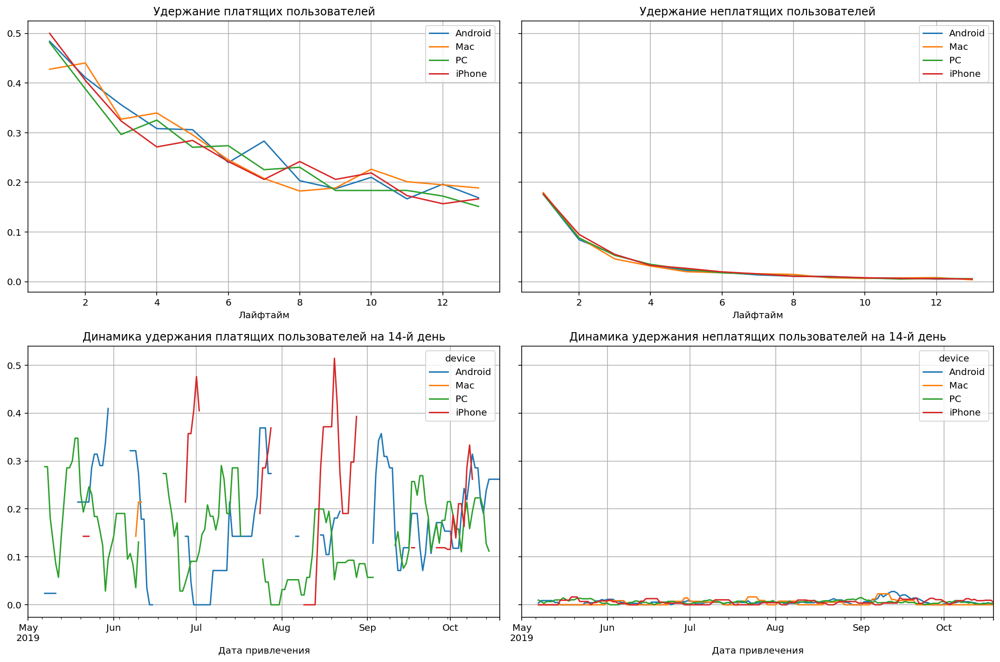

In [86]:
dimensions=['device']

retention_raw, retention_grouped, retention_history = get_retention(
    Europe, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days) 

Удержание в целом падает.

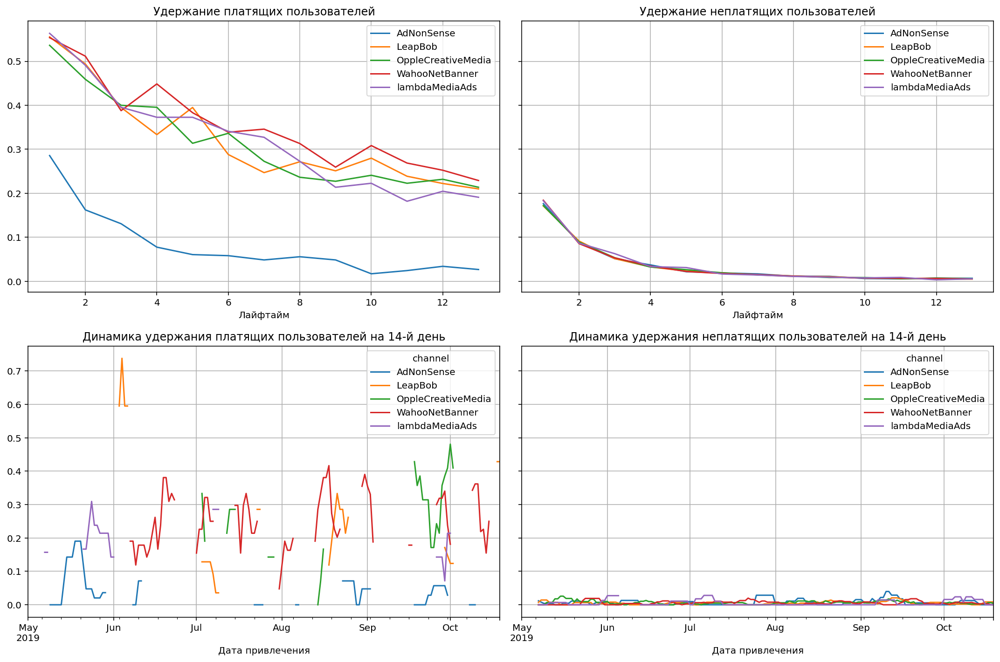

In [87]:
dimensions=['channel']

retention_raw, retention_grouped, retention_history = get_retention(
    Europe, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days)

Хуже всего удерживаются пользователи, привлеченные из AdNonSense. Ситуация такая же, как в США, пользователи, которые чаще всего конвертируются из одного канала, хуже всего удерживаются.

### Вывод.

Выделите причины неэффективности привлечения пользователей.
Сформулируйте рекомендации для отдела маркетинга.


Мы проанализировали различные данные о развлекательном приложении Procrastinate Pro+. После обработки данных и анализа, мы сделали следующие выводы:


- После создания пользовательских профилей мы получили 150 008 пользовательских профилей с данными о дате первого посещения и рекламном источнике,регионе, девайсе. Также мы нашли минимальную и максимальную даты привлечения, они совпали с заданными в ТЗ.
- Приложением пользуются пользователи из 4-х стран: США, Германия, Великобритания и Франция.
  Больше всего пользователей из США - 100 002 из них 6902 пользователя платят за пользование приложением, также США имеет больший   всего процент платящих пользователей - 6,9%. Когорта пользователей из США также самая большая, составляет 66,66% от общего числа пользователей. Минимальное число платящих пользователей находятся во Франции, всего 663 пользователя, это 3,8% от всех пользователей из Франции.
- Больше всего платящих пользователей пользуются Mac, но они занимают меньше всего пользователей от общего числа пользователей. Меньше всего за пользованием приложением платят польхователи PC. Больше всего приложением пользуются пользователи на устройствах Iphone.
- Больше всего в приложении пришло органических пользователей - 56 439 пользователей (37,62% от общего числа пользователей).На втором месте по общему привлечению - FaceBoom (19,43%), на третьем месте - TipTop (13,04%)
- Всего выявили 10 рекламных источников. Наибольшее кол-во платящих пользователей пришло из FaceBoom - 12,2% от привлеченных с этого источника пользователей. На втором месте AdNonSense - 11,34%, на третьем месте lambdaMediaAds - 10,47%.

При анализе маркетинга мы увидели:

- Всего на маркетинг было потрачено 105 497.3 у.е.. Наиболее крупными рекламными источниками были выбраны TipTop и FaceBoom. С течением времени, затраты на эти 2 источника увеличивались, в то время, как остальные источники не получали большого финансирования.
- Средний CAC по всему проекту составил 1,13 ед., самымими дорогими были TipTop, около 2,8 ед., далее FaceBoom (1,1 ед.) и AdNonSense(1 ед.)

После анализа окупаемости рекламы мы заметили:

- По построенным графикам, можно отметить, что расходы на привлечение только растут, однако ROI не достигает окупаемости и на 14 день составляет около 60%.
- Пользователи PC стабильно окупаются, а вот владельцы IPhone и Mac совсем не окупаются, хотя стоимость на их привлечение выше, чем на других платформах. Также заметно снижение динамики ROI у всех устройств.
- В разбивке по странам сильно выбивается США. США единственная страна, где не окупилась реклама, при этом расходы на рекламу в этой стране разительно выше, чем в других странах, также ROI в США падает ниже, хотя LTV выше, чем во всех остальных странах.
- Выше всего LTV в TipTop и lambdaMediaAds,также TipTop имеет сильно выше стоимость привлечения, однако TipTop не достигает порога окупаемости.Также не окупаются еще 2 канала. У остальных каналов динамика привлечения стабильная.

При анализи конверсии и удержания можно отметить, что:
- Хуже всего конвертируются пользователи PC, хоть они и окупаются.Лучше всего конвертируются пользователи Mac и Iphone, хотя реклама на их привлечение совсем не окупается.

Возможные причины неэффективности привлечения пользователей:
- Чрезмерное финансирование нескольких каналов, без анализа их возможной окупаемости.
- Выделение бюджета на привлечение пользователей из США, хотя привлечение не пользователей не окупается.


Рекомендации:

- Перераспределить бюджет на маркетинг с учетом анализа окупаемости источников и учетом целевой аудитории.
- Пересмотреть кол-во и качество источников прривлечения. Некоторые источники приносят мало платящих пользователей, но бюджет на них выделяется.
- Стоит обратить внимание на пользователей из Европы. Большую часть бюджета была выделена на пользователей США. По анализу мы заметили, что пользователи США принесли больше всего платящих пользователей, но реклама совсем не окупилась. Возможно, выделение бОльшего бюджета на другие страны,сбалансирует ситуацию.



 